# (01) BOLD full brain, 192 -- ```GABAN```

**Motivation**: Plot full brain BOLD results using various preprocessing approaches. <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display, Latex

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-Ca-fMRI/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-Ca-fMRI/figs')
tmp_dir = os.path.join(git_dir, 'jb-Ca-fMRI/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_Ca-fMRI'))
from figures.fighelper import *
from analysis.final import *
from utils.render import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
%matplotlib inline
set_style()

## Prep

In [2]:
mice = Mice(192)
bs = Base(mice, mode='ca2')

In [3]:
kws_show = show_kws(7)
kws_show['vmin'] = 0.05
kws_show['vmax'] = 0.6
kws_show['mask_thresh'] = 0.10
kws_show['add_disjoint'] = True

kws_show

{
    'vmin': 0.05,
    'vmax': 0.6,
    'mask_thresh': 0.1,
    'label_fontsize': 16,
    'add_disjoint': True,
    'titles': True
}

In [4]:
default_descs('bold')

['raw', 'rabies', 'rabies-hp', 'rabies-nocr', 'rabies-nowmcsf']

## desc=```rabies-hp```

### k = 7

In [5]:
num_k = 7

In [6]:
mice.set_kws(desc_bold='rabies-hp')
gr = Group(
    num_k=num_k,
    mice=mice,
    mode='bold',
    perc='p20-sample',
).load_group()
_ = gr.avg()

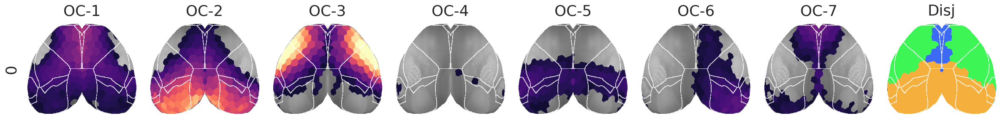

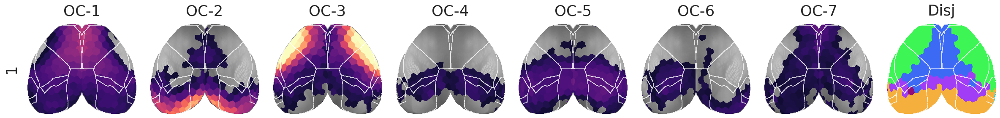

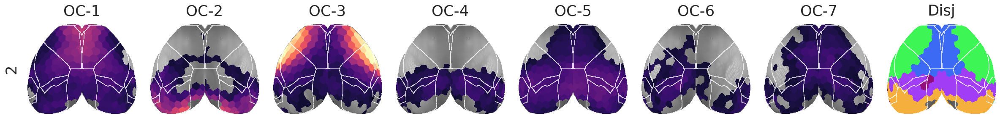

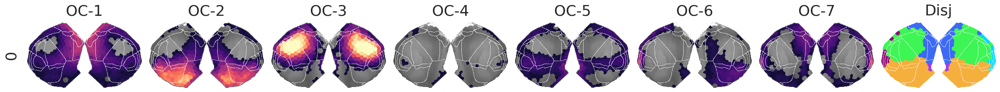

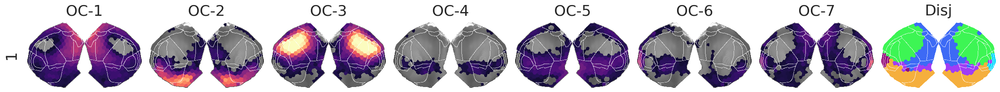

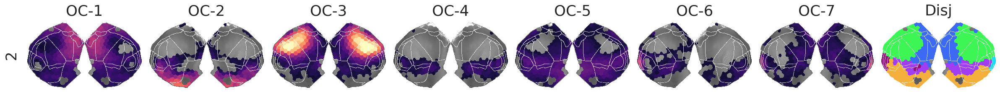

In [7]:
for proj in ['top', 'flat']:
    for layer in [0, 1, 2]:
        gr.show({layer: gr.pi}, layer=layer, proj=proj, **kws_show);

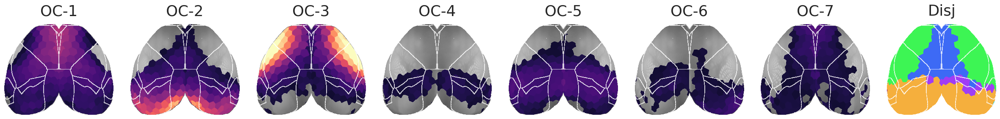

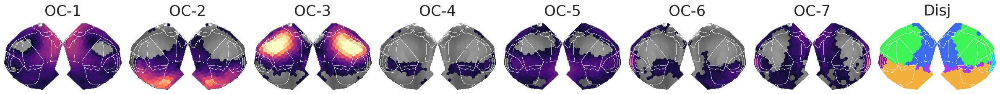

In [8]:
pi_surf = gr.get_surface_pi()
gr.show(pi_surf, proj='top', **kws_show);
gr.show(pi_surf, proj='flat', **kws_show);

#### Full Brain Plot

In [9]:
template, _ = mice.al.mcc.get_template_volume()
template = template.astype('uint32')
root = mice.al.get_masks('root')
brn = mice.parcel['brain'][:]
region_idxs = unique_idxs(brn)

In [10]:
pi_brn = np_nans((num_k, *brn.shape))

for oc in range(num_k):
    for i, n in gr.id2n.items():
        pi_brn[oc].flat[region_idxs[i]] = gr.pi[oc, n]

In [11]:
interp = 'antialiased'

slices = range(10, 111, 9)
ncols = len(slices)
nrows = len(pi_brn)

fig = plt.figure(figsize=(38, 2.23 * nrows), dpi=200)
gs = GridSpec(
    nrows=nrows,
    ncols=ncols + 2,
    width_ratios=[1] * ncols + [0.01, 0.1],
    wspace=0.04,
    hspace=0.04,
)

for i, v in enumerate(pi_brn):
    for j, s_ in enumerate(slices):
        ax = fig.add_subplot(gs[i, j])
        remove_ticks(ax, False)
        ax.annotate(
            text=s_,
            xy=(0.01, 0.9),
            xycoords='axes fraction',
            color='dimgrey',
        )
        ax.imshow(
            X=mwh(~root[s_], template[s_]),
            cmap='Greys_r',
        )
        im = ax.imshow(
            X=mwh(v[s_] < kws_show['mask_thresh'], v[s_]),
            cmap='YlOrRd',
            vmin=kws_show['vmin'],
            vmax=np.nanmax(v),
            interpolation=interp,
        )
        if j == 0:
            ax.set_ylabel(f"OC-{i+1}", fontsize=20)
    cax = fig.add_subplot(gs[i, -1])
    plt.colorbar(im, cax=cax)
plt.close()

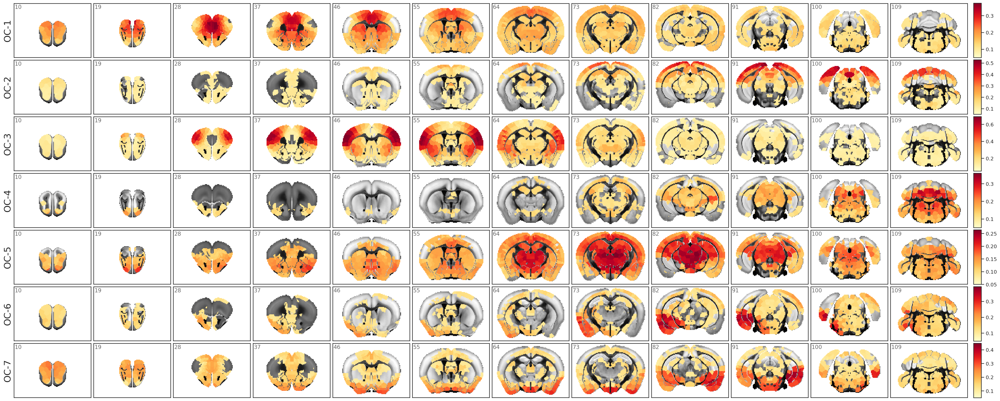

In [12]:
fig

### k = 10

In [13]:
num_k = 10

In [14]:
mice.set_kws(desc_bold='rabies-hp')
gr = Group(
    num_k=num_k,
    mice=mice,
    mode='bold',
    perc='p20-sample',
).load_group()
_ = gr.avg()

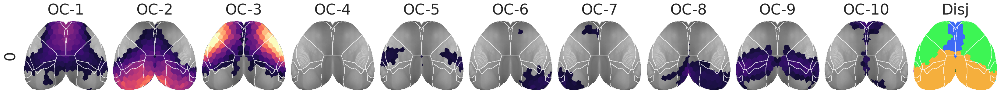

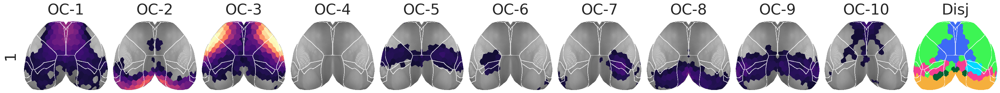

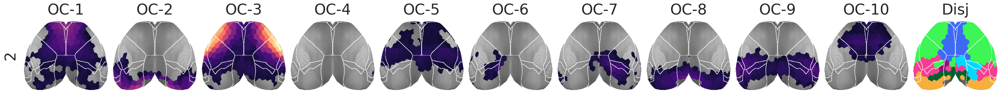

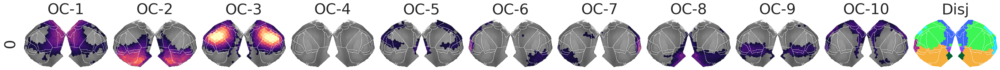

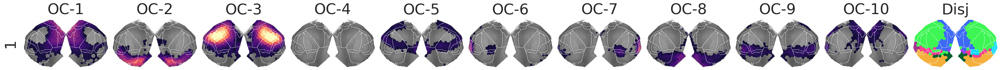

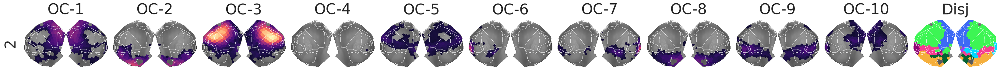

In [15]:
for proj in ['top', 'flat']:
    for layer in [0, 1, 2]:
        gr.show({layer: gr.pi}, layer=layer, proj=proj, **kws_show);

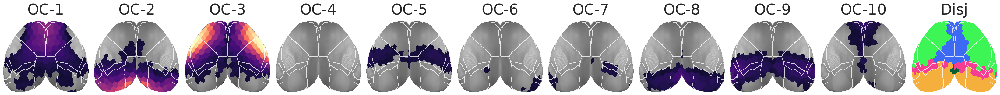

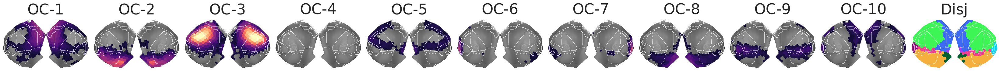

In [16]:
pi_surf = gr.get_surface_pi()
gr.show(pi_surf, proj='top', **kws_show);
gr.show(pi_surf, proj='flat', **kws_show);

#### Full Brain Plot

In [17]:
template, _ = mice.al.mcc.get_template_volume()
template = template.astype('uint32')
root = mice.al.get_masks('root')
brn = mice.parcel['brain'][:]
region_idxs = unique_idxs(brn)

In [18]:
pi_brn = np_nans((num_k, *brn.shape))

for oc in range(num_k):
    for i, n in gr.id2n.items():
        pi_brn[oc].flat[region_idxs[i]] = gr.pi[oc, n]

In [29]:
interp = 'antialiased'

slices = range(10, 111, 9)
ncols = len(slices)
nrows = len(pi_brn)

fig = plt.figure(figsize=(38, 2.23 * nrows), dpi=200)
gs = GridSpec(
    nrows=nrows,
    ncols=ncols + 2,
    width_ratios=[1] * ncols + [0.01, 0.1],
    wspace=0.04,
    hspace=0.04,
)

for i, v in enumerate(pi_brn):
    for j, s_ in enumerate(slices):
        ax = fig.add_subplot(gs[i, j])
        remove_ticks(ax, False)
        ax.annotate(
            text=s_,
            xy=(0.01, 0.9),
            xycoords='axes fraction',
            color='dimgrey',
        )
        ax.imshow(
            X=mwh(~root[s_], template[s_]),
            cmap='Greys_r',
        )
        im = ax.imshow(
            X=mwh(v[s_] < kws_show['mask_thresh'], v[s_]),
            cmap='YlOrRd',
            vmin=kws_show['vmin'],
            vmax=np.nanmax(v),
            interpolation=interp,
        )
        if j == 0:
            ax.set_ylabel(f"OC-{i+1}", fontsize=20)
    cax = fig.add_subplot(gs[i, -1])
    plt.colorbar(im, cax=cax)
plt.close()

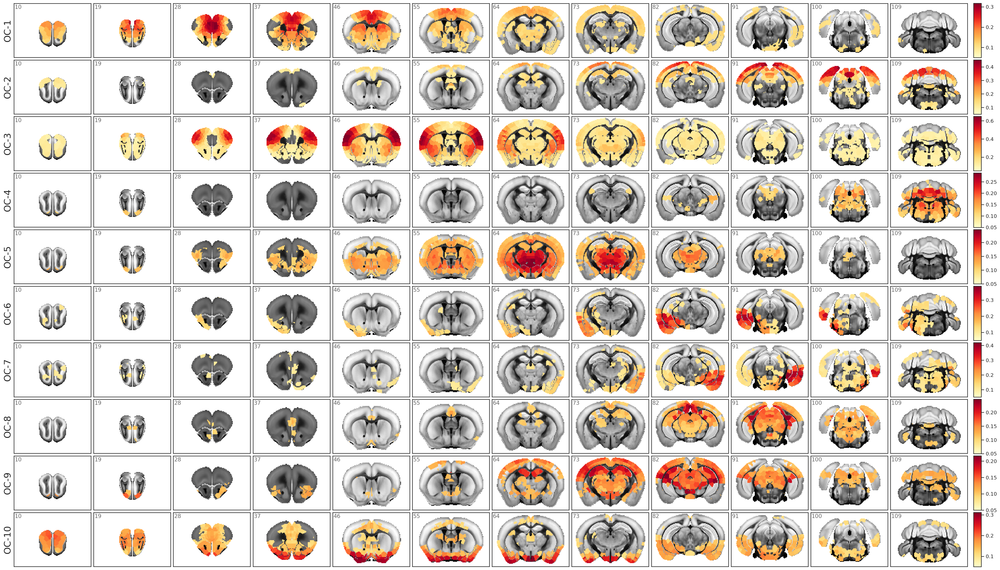

In [30]:
fig

## desc=```rabies-nowmcsf```

In [8]:
mice.set_kws(desc_bold='rabies-nowmcsf')
gr = Group(
    num_k=7,
    mice=mice,
    mode='bold',
    perc='p20-sample',
).load_group()
_ = gr.avg()

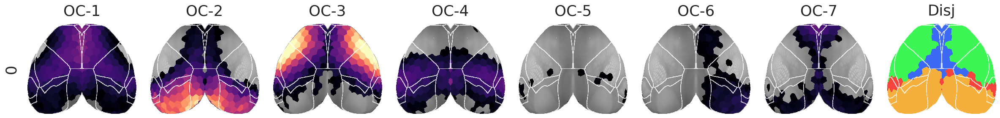

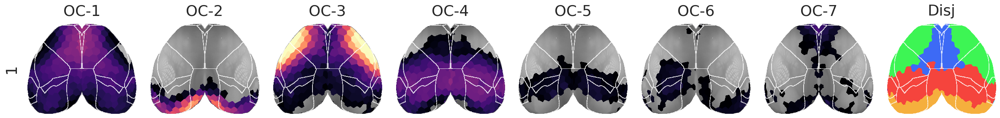

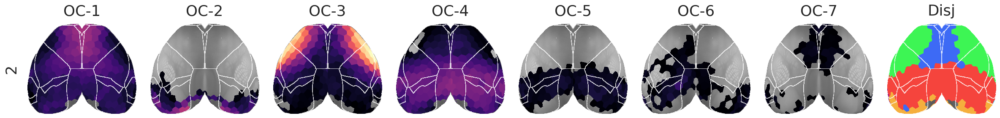

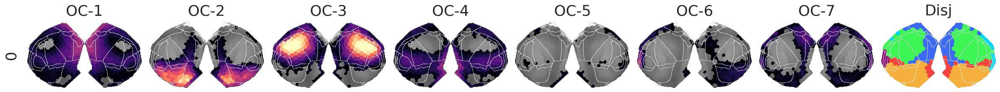

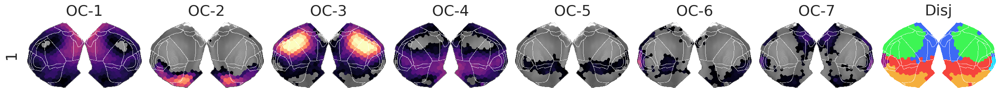

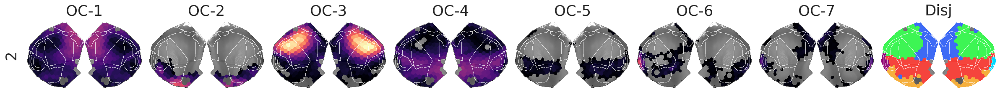

In [9]:
for proj in ['top', 'flat']:
    for layer in [0, 1, 2]:
        gr.show({layer: gr.pi}, layer=layer, proj=proj, **kws_show);

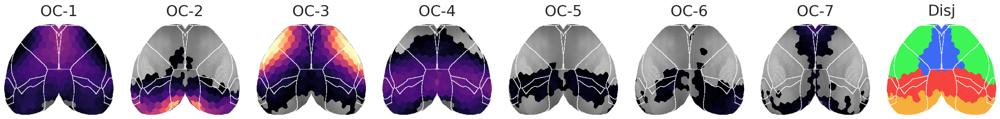

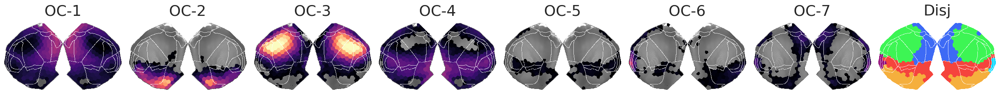

In [10]:
pi_surf = gr.get_surface_pi()
gr.show(pi_surf, proj='top', **kws_show);
gr.show(pi_surf, proj='flat', **kws_show);

## desc=```rabies```

In [11]:
mice.set_kws(desc_bold='rabies')
gr = Group(
    num_k=7,
    mice=mice,
    mode='bold',
    perc='p20-sample',
).load_group()
_ = gr.avg()

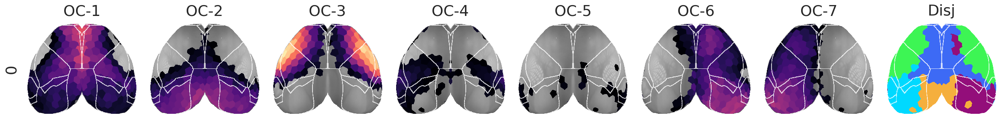

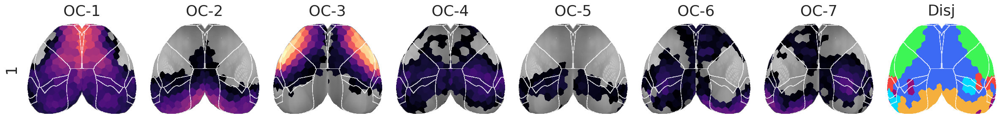

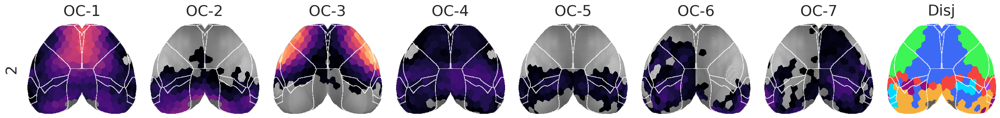

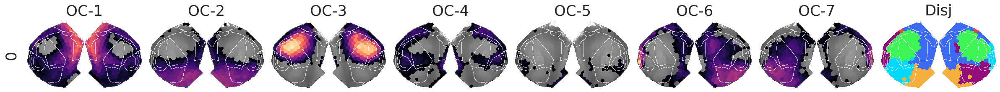

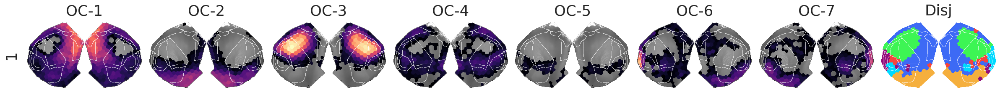

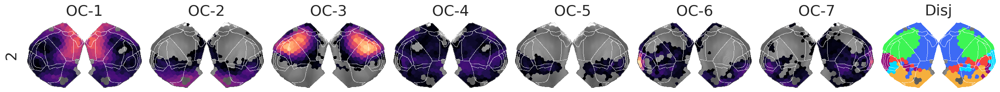

In [12]:
for proj in ['top', 'flat']:
    for layer in [0, 1, 2]:
        gr.show({layer: gr.pi}, layer=layer, proj=proj, **kws_show);

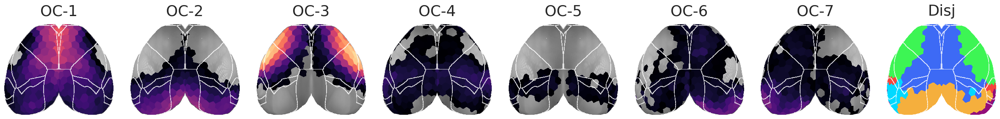

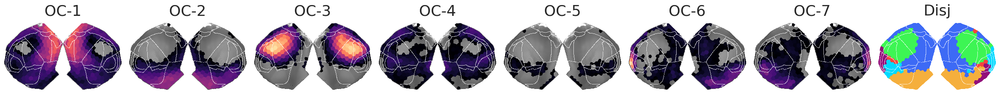

In [13]:
pi_surf = gr.get_surface_pi()
gr.show(pi_surf, proj='top', **kws_show);
gr.show(pi_surf, proj='flat', **kws_show);

## desc=```rabies-nocr```

In [14]:
mice.set_kws(desc_bold='rabies-nocr')
gr = Group(
    num_k=7,
    mice=mice,
    mode='bold',
    perc='p20-sample',
).load_group()
_ = gr.avg()

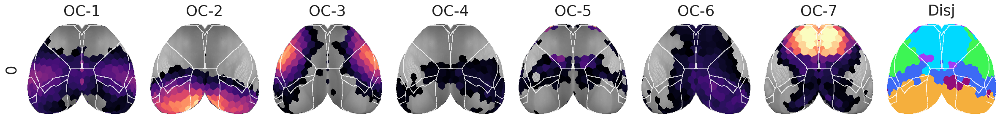

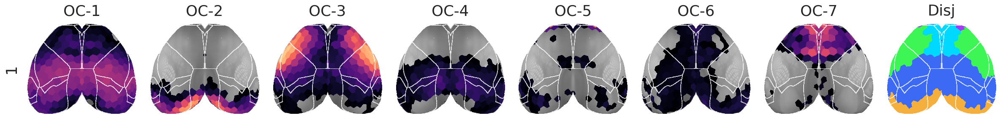

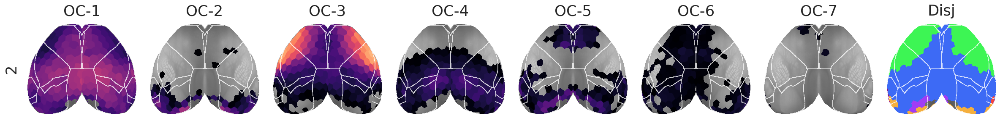

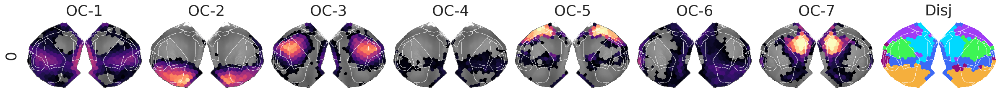

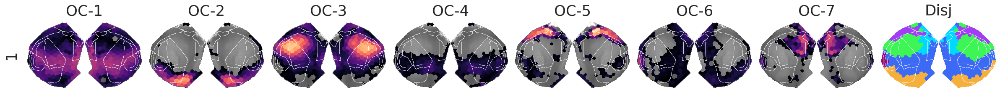

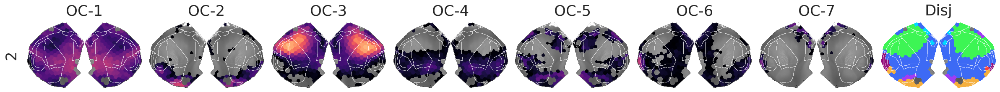

In [15]:
for proj in ['top', 'flat']:
    for layer in [0, 1, 2]:
        gr.show({layer: gr.pi}, layer=layer, proj=proj, **kws_show);

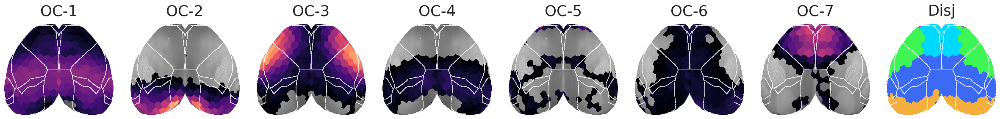

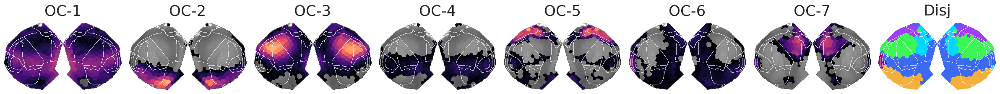

In [16]:
pi_surf = gr.get_surface_pi()
gr.show(pi_surf, proj='top', **kws_show);
gr.show(pi_surf, proj='flat', **kws_show);

## desc=```raw```

In [17]:
mice.set_kws(desc_bold='raw')
gr = Group(
    num_k=7,
    mice=mice,
    mode='bold',
    perc='p20-sample',
).load_group()
_ = gr.avg()

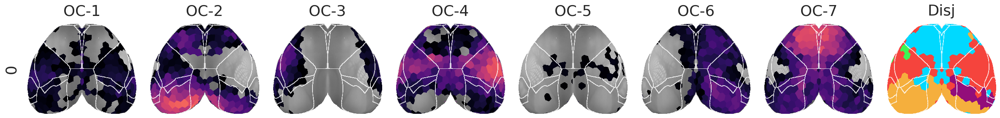

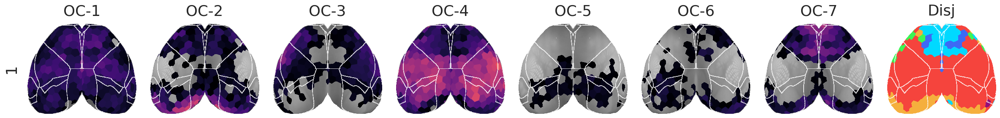

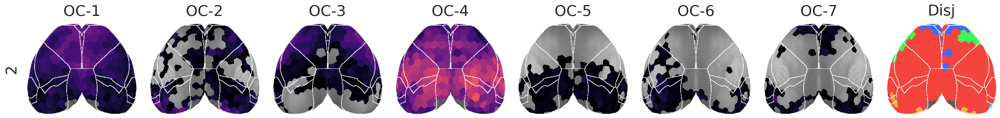

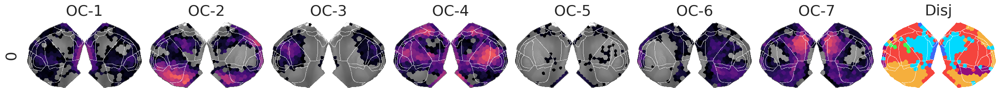

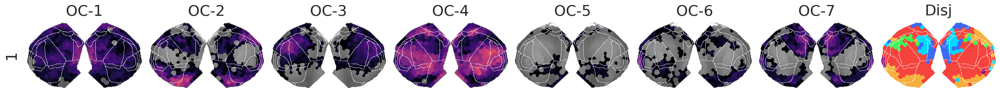

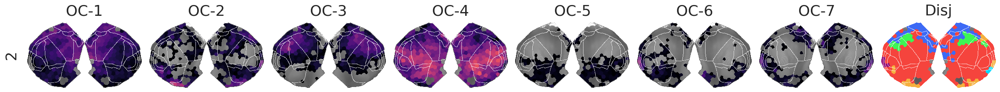

In [18]:
for proj in ['top', 'flat']:
    for layer in [0, 1, 2]:
        gr.show({layer: gr.pi}, layer=layer, proj=proj, **kws_show);

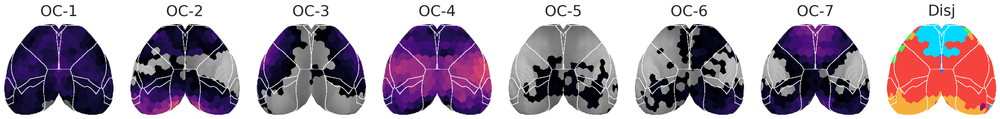

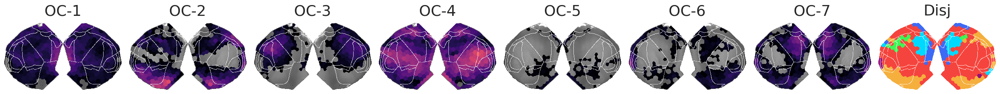

In [19]:
pi_surf = gr.get_surface_pi()
gr.show(pi_surf, proj='top', **kws_show);
gr.show(pi_surf, proj='flat', **kws_show);